# Testing batdetect2 pipeline features:

## **Working on features relevant to the use of this pipeline on recovered Audiomoth .wav recordings**

## 1) Figuring out our imports:

### a) Below are the imports pertaining to accessing data and metadata

In [2]:
from pathlib import Path
import glob
import exiftool
import suncalc
import soundfile as sf
import re

### b) Below are the imports pertaining to data manipulation

In [1]:
import numpy as np
import pandas as pd
import dask.dataframe as dd

### c) Below are the imports pertaining to data visualization

In [3]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib import colors
import datetime as dt

### d) Below are the imports pertaining to the use of the MSDS pipeline

In [4]:
import sys

# append the path of the
# parent directory
sys.path.append('..')
sys.path.append('../src/')
sys.path.append('../src/models/bat_call_detector/batdetect2/')

import src.batdt2_pipeline as batdetect2_pipeline
import src.file_dealer as file_dealer
from cfg import get_config

In [5]:
SEATTLE_LATITUDE = 47.655181
SEATTLE_LONGITUDE = -122.293123

## 2) For our current project requirements, we read in batdetect2 outputs to compile # of detections per 30-min intervals

In [6]:
dets = pd.read_csv(f'../output_dir/recover-20230809/Telephone Field/bd2__recover-20230809_UBNA_010.csv')
dets['ref_time'] = pd.to_datetime(dets['input_file'], format="%Y%m%d_%H%M%S", exact=False)
dets_per_file = dets.groupby(['ref_time'])['ref_time'].count()

num_dets = pd.read_csv(f'../output_dir/recover-20230809/Telephone Field/activity__recover-20230809_UBNA_010.csv', index_col=0)
num_dets

,num_of_detections,HF2_num_of_detections,HF1_num_of_detections,LF1_num_of_detections
date_and_time_UTC,,,,
2023-08-02 03:00:00+00:00,1,1,1,1
2023-08-02 03:30:00+00:00,1,1,1,1
2023-08-02 04:00:00+00:00,7,1,7,1
2023-08-02 04:30:00+00:00,31,1,28,3
2023-08-02 05:00:00+00:00,22,1,1,22
...,...,...,...,...
2023-08-09 11:00:00+00:00,1,1,1,1
2023-08-09 11:30:00+00:00,1,1,1,1
2023-08-09 12:00:00+00:00,74,3,71,1


## 3) These results are saved as dataframes to allow easy manipulation

In [7]:
activity_datetimes = pd.to_datetime(num_dets.index.values)
raw_dates = activity_datetimes.strftime("%m/%d/%y")
raw_times = activity_datetimes.strftime("%H:%M")

col_name = f"num_of_detections"
data = list(zip(raw_dates, raw_times, num_dets[col_name]))
activity = pd.DataFrame(data, columns=["Date (UTC)", "Time (UTC)", col_name])
activity_df = activity.pivot(index="Time (UTC)", columns="Date (UTC)", values=col_name)
activity_df

Date (UTC),08/02/23,08/03/23,08/04/23,08/05/23,08/06/23,08/07/23,08/08/23,08/09/23
Time (UTC),,,,,,,,
03:00,1,1,1,1,1,1,1,1
03:30,1,1,1,1,7,1,1,1
04:00,7,120,29,24,29,23,422,269
04:30,31,185,29,4,43,148,9,1
05:00,22,25,13,5,2,2,1,23
05:30,60,1,1,1,1,2,1,10
06:00,3,1,72,1,1,19,8,12
06:30,62,65,1,10,2,2,10,1
07:00,95,78,1,1,35,1,9,136


## 4) A later addition to this repository was `src/file_dealer.py` which assembles a comprehensive summary of all collected records from a given hard drive

In [8]:
cfg = dict()
cfg["input_dir"] = f'{Path.home()}/Documents/Research/Recordings'
cfg["output_dir"] = Path("../output_dir")
cfg['time'] = '07:30'
cfg['date'] = '08'
cfg["month"] = 'July'
cfg['year'] = '2022'

In [9]:
(dt.datetime.strptime(cfg['time'], '%H:%M')).time()

datetime.time(7, 30)

In [10]:
cur_data_records = pd.read_csv(f'../output_dir/ubna_data_03_collected_audio_records.csv', dtype=str, index_col=0)
cur_data_records["datetime_UTC"] = pd.DatetimeIndex(cur_data_records["datetime_UTC"])
cur_data_records.set_index("datetime_UTC", inplace=True)

In [11]:
cur_data_records.loc[(cur_data_records.index>=dt.datetime(2023, 9, 20))&(cur_data_records['sd_card_num']=='007')]

,site_name,recover_folder,audiomoth_num,sd_card_num,file_path,file_metadata,file_status,audiomoth_temperature,audiomoth_battery,sample_rate,audiomoth_artist_ID,file_duration,Deployment notes
datetime_UTC,,,,,,,,,,,,,
2023-09-21 00:00:00,Foliage,recover-20230927,G,007,/mnt/ubna_data_03/recover-20230927/UBNA_007/20...,Recorded at 00:00:00 21/09/2023 (UTC) by Audio...,Usable for detection,17.1C,4.2V,192000,AudioMoth 245AAA0563FACFB3,1795.00127083333,Ikea Batteries Nighttime 0:00-15:00 UTC; Recon...
2023-09-21 00:30:00,Foliage,recover-20230927,G,007,/mnt/ubna_data_03/recover-20230927/UBNA_007/20...,Recorded at 00:30:00 21/09/2023 (UTC) by Audio...,Usable for detection,19.6C,4.2V,192000,AudioMoth 245AAA0563FACFB3,1795.00127083333,Ikea Batteries Nighttime 0:00-15:00 UTC; Recon...
2023-09-21 01:00:00,Foliage,recover-20230927,G,007,/mnt/ubna_data_03/recover-20230927/UBNA_007/20...,Recorded at 01:00:00 21/09/2023 (UTC) by Audio...,Usable for detection,21.2C,4.2V,192000,AudioMoth 245AAA0563FACFB3,1795.00127083333,Ikea Batteries Nighttime 0:00-15:00 UTC; Recon...
2023-09-21 01:30:00,Foliage,recover-20230927,G,007,/mnt/ubna_data_03/recover-20230927/UBNA_007/20...,Recorded at 01:30:00 21/09/2023 (UTC) by Audio...,Usable for detection,19.1C,4.2V,192000,AudioMoth 245AAA0563FACFB3,1795.00127083333,Ikea Batteries Nighttime 0:00-15:00 UTC; Recon...
2023-09-21 02:00:00,Foliage,recover-20230927,G,007,/mnt/ubna_data_03/recover-20230927/UBNA_007/20...,Recorded at 02:00:00 21/09/2023 (UTC) by Audio...,Usable for detection,18.0C,4.1V,192000,AudioMoth 245AAA0563FACFB3,1795.00127083333,Ikea Batteries Nighttime 0:00-15:00 UTC; Recon...
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-05-12 18:10:00,Telephone Field,recover-20240517,C,007,/mnt/ubna_data_03/recover-20240517/UBNA_007/20...,Recorded at 18:10:00 12/05/2024 (UTC) by Audio...,Usable for detection,20.2C,4.0V,192000,AudioMoth 24F319055FDF2F5B,300.001270833333,Ikea Batteries 0:00-24:00 UTC; Configured to 5...
2024-05-12 18:20:00,Telephone Field,recover-20240517,C,007,/mnt/ubna_data_03/recover-20240517/UBNA_007/20...,Recorded at 18:20:00 12/05/2024 (UTC) by Audio...,Usable for detection,19.9C,4.0V,192000,AudioMoth 24F319055FDF2F5B,300.001270833333,Ikea Batteries 0:00-24:00 UTC; Configured to 5...
2024-05-12 18:30:00,Telephone Field,recover-20240517,C,007,/mnt/ubna_data_03/recover-20240517/UBNA_007/20...,Recorded at 18:30:00 12/05/2024 (UTC) by Audio...,Usable for detection,19.8C,4.0V,192000,AudioMoth 24F319055FDF2F5B,300.001270833333,Ikea Batteries 0:00-24:00 UTC; Configured to 5...


### We can gather all the 'good' files using this Dataframe instead of having to check for good files during detection.

In [12]:
hard_drive_df = dd.read_csv(f'../output_dir/ubna_data_*_collected_audio_records.csv', dtype=str).compute()
if 'Unnamed: 0' in hard_drive_df.columns:
    hard_drive_df.drop(columns='Unnamed: 0', inplace=True)
hard_drive_df["Datetime UTC"] = pd.DatetimeIndex(hard_drive_df["Datetime UTC"])
hard_drive_df.set_index("Datetime UTC", inplace=True)

site_name = 'Foliage'
data_params = dict()
data_params['site'] = site_name

site_name_cond = hard_drive_df["Site name"] == site_name

file_year_cond = hard_drive_df.index.year == (dt.datetime.strptime(cfg['year'], '%Y')).year
file_month_cond = hard_drive_df.index.month == (dt.datetime.strptime(cfg['month'], '%B')).month
file_day_cond = hard_drive_df.index.day == (dt.datetime.strptime(cfg['date'], '%d')).day
file_time_cond = hard_drive_df.index.time == (dt.datetime.strptime(cfg['time'], '%H:%M')).time()

minute_cond = np.logical_or((hard_drive_df.index).minute == 30, (hard_drive_df.index).minute == 0)
datetime_cond = np.logical_and((hard_drive_df.index).second == 0, minute_cond)
file_error_cond = np.logical_and((hard_drive_df["File duration"]!='File has no comment due to error!'), (hard_drive_df["File duration"]!='File has no Audiomoth-related comment'))
all_errors_cond = np.logical_and((hard_drive_df["File duration"]!='Is empty!'), file_error_cond)
file_date_cond = np.logical_and(np.logical_and(file_year_cond, file_month_cond), np.logical_and(file_time_cond, file_day_cond))

filtered_location_df = hard_drive_df.loc[site_name_cond&datetime_cond&file_date_cond&all_errors_cond].sort_index()
filtered_location_nightly_df = filtered_location_df.between_time('03:00', '13:30', inclusive="left")

data_params['output_dir'] = cfg["output_dir"] / data_params["site"]
print(f"Will save csv file to {data_params['output_dir']}")

data_params['ref_audio_files'] = filtered_location_nightly_df["File path"].apply(lambda x : Path(x)).values
file_status_cond = filtered_location_nightly_df["File status"] == "Usable for detection"
file_duration_cond = np.isclose(filtered_location_nightly_df["File duration"].astype('float'), 1795)
good_deploy_session_df = filtered_location_nightly_df.loc[file_status_cond&file_duration_cond]
data_params['good_audio_files'] = good_deploy_session_df["File path"].apply(lambda x : Path(x)).values
data_params['recover_folder'] = good_deploy_session_df["Recover folder"].values
data_params['audiomoth_folder'] = good_deploy_session_df["SD card #"].values

if list(data_params['good_audio_files']) == list(data_params['ref_audio_files']):
    print("All files from deployment session good!")
else:
    print("Error files exist!")

data_params['good_audio_files']

Will save csv file to ../output_dir/Foliage
All files from deployment session good!


array([PosixPath('/mnt/ubna_data_01/recover-20220709_unit3/20220708_073000.WAV')],
      dtype=object)

##### **Checking the difference between glob.glob() and Path.glob()**

In [13]:
glob.glob(f"{cfg['input_dir']}/recover-*/**/*.WAV", recursive=True)

['/Users/adityakrishna/Documents/Research/Recordings/recover-20240607/UBNA_004/20240602_044000.WAV',
 '/Users/adityakrishna/Documents/Research/Recordings/recover-20240607/UBNA_004/20240602_082000.WAV',
 '/Users/adityakrishna/Documents/Research/Recordings/recover-20240607/UBNA_017/20240607_050000.WAV',
 '/Users/adityakrishna/Documents/Research/Recordings/recover-20240607/UBNA_017/20240603_045000.WAV',
 '/Users/adityakrishna/Documents/Research/Recordings/recover-20240607/UBNA_011/20240603_051000.WAV',
 '/Users/adityakrishna/Documents/Research/Recordings/recover-20240607/UBNA_011/20240607_044000.WAV',
 '/Users/adityakrishna/Documents/Research/Recordings/recover-20240719/UBNA_011/20240715_081000.WAV',
 '/Users/adityakrishna/Documents/Research/Recordings/recover-20240122/UBNA_001/20240121_013000.WAV',
 '/Users/adityakrishna/Documents/Research/Recordings/recover-20240729/UBNA_008/20240729_052000.WAV',
 '/Users/adityakrishna/Documents/Research/Recordings/recover-20240729/UBNA_008/20240729_050

In [14]:
path_glob = Path(cfg['input_dir']).glob(pattern='recover-*/**/*.WAV')
files = list(path_glob)
files

[PosixPath('/Users/adityakrishna/Documents/Research/Recordings/recover-20240607/UBNA_004/20240602_044000.WAV'),
 PosixPath('/Users/adityakrishna/Documents/Research/Recordings/recover-20240607/UBNA_004/20240602_082000.WAV'),
 PosixPath('/Users/adityakrishna/Documents/Research/Recordings/recover-20240607/UBNA_017/20240607_050000.WAV'),
 PosixPath('/Users/adityakrishna/Documents/Research/Recordings/recover-20240607/UBNA_017/20240603_045000.WAV'),
 PosixPath('/Users/adityakrishna/Documents/Research/Recordings/recover-20240607/UBNA_011/20240603_051000.WAV'),
 PosixPath('/Users/adityakrishna/Documents/Research/Recordings/recover-20240607/UBNA_011/20240607_044000.WAV'),
 PosixPath('/Users/adityakrishna/Documents/Research/Recordings/recover-20240719/UBNA_011/20240715_081000.WAV'),
 PosixPath('/Users/adityakrishna/Documents/Research/Recordings/recover-20240122/UBNA_001/20240121_013000.WAV'),
 PosixPath('/Users/adityakrishna/Documents/Research/Recordings/recover-20240729/UBNA_008/20240729_052000

##### **Printing out the outputs of exiftool.get_metadata()**

In [15]:
with exiftool.ExifToolHelper() as et:
    print(et.get_metadata(files[0]))

[{'SourceFile': '/Users/adityakrishna/Documents/Research/Recordings/recover-20240607/UBNA_004/20240602_044000.WAV', 'ExifTool:ExifToolVersion': 12.63, 'File:FileName': '20240602_044000.WAV', 'File:Directory': '/Users/adityakrishna/Documents/Research/Recordings/recover-20240607/UBNA_004', 'File:FileSize': 115200488, 'File:FileModifyDate': '2024:06:01 21:45:00-07:00', 'File:FileAccessDate': '2024:07:15 23:35:17-07:00', 'File:FileInodeChangeDate': '2024:07:15 23:35:17-07:00', 'File:FilePermissions': 100755, 'File:FileType': 'WAV', 'File:FileTypeExtension': 'WAV', 'File:MIMEType': 'audio/x-wav', 'RIFF:Encoding': 1, 'RIFF:NumChannels': 1, 'RIFF:SampleRate': 192000, 'RIFF:AvgBytesPerSec': 384000, 'RIFF:BitsPerSample': 16, 'RIFF:Comment': 'Recorded at 04:40:00 02/06/2024 (UTC) by AudioMoth 242A260463FAA15B at medium gain while battery was 4.0V and temperature was 16.9C.', 'RIFF:Artist': 'AudioMoth 242A260463FAA15B', 'Composite:Duration': 300.001270833333}]


## 4) Develop any of the main functions below:

### a) Using `dask.dataframe` to concatenate all generated detections into 1 large `pandas.dataframe`.

In [16]:
new_df = dd.read_csv(f"../output_dir/recover-2023*/Telephone Field/bd2__*.csv").compute()
new_df

,start_time,end_time,low_freq,high_freq,detection_confidence,event,input_file,class,class_prob,det_prob,individual,Recover Folder,SD Card,Site name
0,162.4855,162.4921,46953.0,56985.0,0.632,Echolocation,20230531_043000.WAV,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,164.9085,164.9138,44375.0,52060.0,0.528,Echolocation,20230531_043000.WAV,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,168.0525,168.0585,46953.0,57225.0,0.598,Echolocation,20230531_043000.WAV,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,168.9195,168.9253,47812.0,58804.0,0.581,Echolocation,20230531_043000.WAV,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,169.3145,169.3201,46953.0,57417.0,0.629,Echolocation,20230531_043000.WAV,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
106,276.9115,276.9189,27187.0,36352.0,NaN,Echolocation,/mnt/ubna_data_03/recover-20231228/UBNA_018/20...,Eptesicus serotinus,0.313,0.653,-1.0,recover-20231228,UBNA_018,(Site not found in Field Records)
107,277.1235,277.1313,27187.0,35025.0,NaN,Echolocation,/mnt/ubna_data_03/recover-20231228/UBNA_018/20...,Nyctalus leisleri,0.318,0.653,-1.0,recover-20231228,UBNA_018,(Site not found in Field Records)
108,277.3455,277.3543,27187.0,40231.0,NaN,Echolocation,/mnt/ubna_data_03/recover-20231228/UBNA_018/20...,Nyctalus leisleri,0.499,0.705,-1.0,recover-20231228,UBNA_018,(Site not found in Field Records)
109,103.4325,103.4574,17734.0,20337.0,NaN,Echolocation,/mnt/ubna_data_03/recover-20231228/UBNA_018/20...,Nyctalus noctula,0.419,0.542,-1.0,recover-20231228,UBNA_018,(Site not found in Field Records)


### b) This concatenation is used to plot a location summary of activity
### The below plots generate the cumulative plots found in `output_dir/cumulative_plots` 

/home/adkris/bat-detector-msds/notebooks/../src/batdt2_pipeline.py:680: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  resampled_df = new_df.resample(data_params["resample_tag"], on="date_and_time_UTC").sum().between_time(cfg['recording_start'], cfg['recording_end'], inclusive='left')


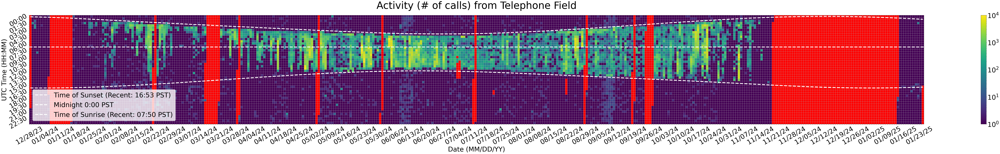

/home/adkris/bat-detector-msds/notebooks/../src/batdt2_pipeline.py:680: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  resampled_df = new_df.resample(data_params["resample_tag"], on="date_and_time_UTC").sum().between_time(cfg['recording_start'], cfg['recording_end'], inclusive='left')


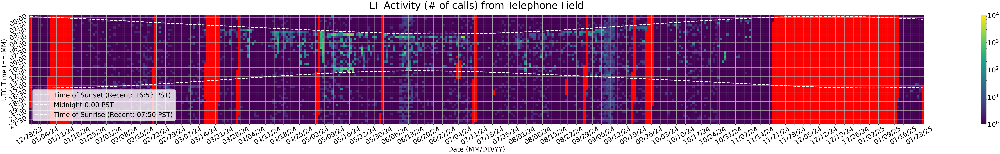

/home/adkris/bat-detector-msds/notebooks/../src/batdt2_pipeline.py:680: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  resampled_df = new_df.resample(data_params["resample_tag"], on="date_and_time_UTC").sum().between_time(cfg['recording_start'], cfg['recording_end'], inclusive='left')


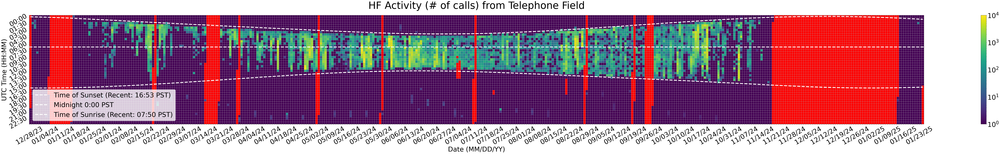

In [7]:
site = "Telephone Field"
cfg = dict()
cfg["site"] = site
cfg["recording_start"] = '00:00'
cfg["recording_end"] = '23:59'
cfg['resample_tag'] = "30T"
cfg['show_PST'] = False
cfg['selection_of_dates'] = 'recover-202[4|5]*'

for group in ['','LF','HF']:
    activity_df = batdetect2_pipeline.construct_cumulative_activity(cfg, cfg, group, save=False)
    batdetect2_pipeline.plot_cumulative_activity(activity_df, cfg, group, save=False)

/home/adkris/bat-detector-msds/notebooks/../src/batdt2_pipeline.py:680: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  resampled_df = new_df.resample(data_params["resample_tag"], on="date_and_time_UTC").sum().between_time(cfg['recording_start'], cfg['recording_end'], inclusive='left')


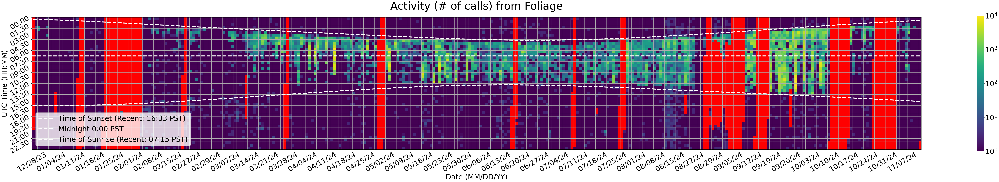

/home/adkris/bat-detector-msds/notebooks/../src/batdt2_pipeline.py:680: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  resampled_df = new_df.resample(data_params["resample_tag"], on="date_and_time_UTC").sum().between_time(cfg['recording_start'], cfg['recording_end'], inclusive='left')


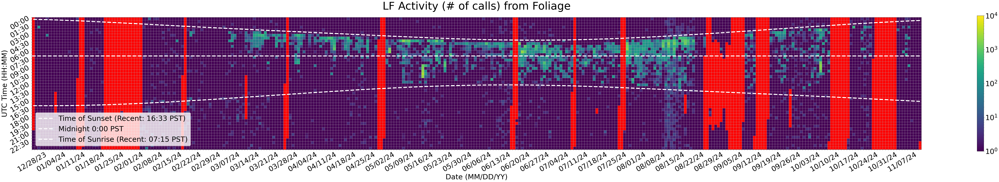

/home/adkris/bat-detector-msds/notebooks/../src/batdt2_pipeline.py:680: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  resampled_df = new_df.resample(data_params["resample_tag"], on="date_and_time_UTC").sum().between_time(cfg['recording_start'], cfg['recording_end'], inclusive='left')


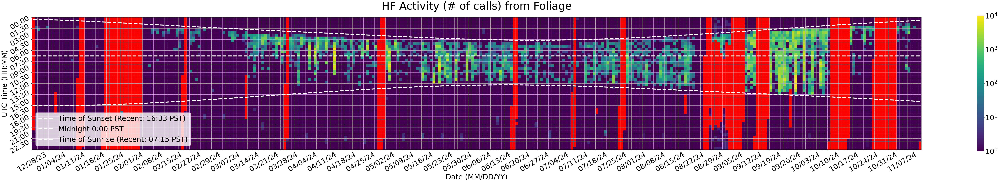

In [8]:
site = "Foliage"
cfg = dict()
cfg["site"] = site
cfg["recording_start"] = '00:00'
cfg["recording_end"] = '23:59'
cfg['resample_tag'] = "30T"
cfg['show_PST'] = False
cfg['selection_of_dates'] = 'recover-202[4|5]*'

for group in ['','LF','HF']:
    activity_df = batdetect2_pipeline.construct_cumulative_activity(cfg, cfg, group, save=False)
    batdetect2_pipeline.plot_cumulative_activity(activity_df, cfg, group, save=False)

/home/adkris/bat-detector-msds/notebooks/../src/batdt2_pipeline.py:680: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  resampled_df = new_df.resample(data_params["resample_tag"], on="date_and_time_UTC").sum().between_time(cfg['recording_start'], cfg['recording_end'], inclusive='left')


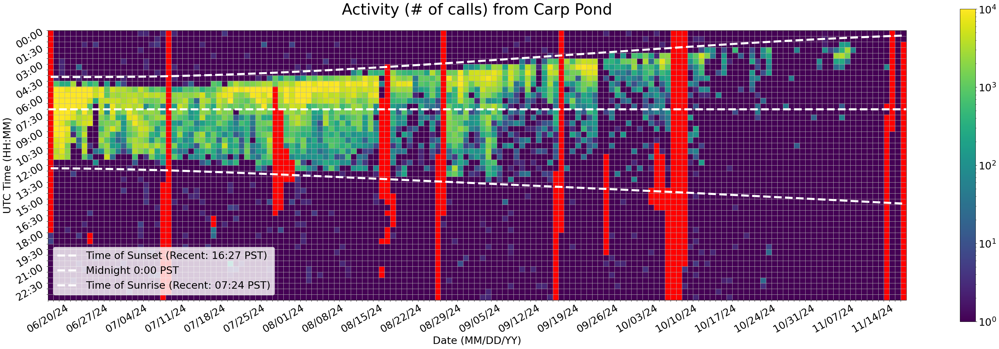

/home/adkris/bat-detector-msds/notebooks/../src/batdt2_pipeline.py:680: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  resampled_df = new_df.resample(data_params["resample_tag"], on="date_and_time_UTC").sum().between_time(cfg['recording_start'], cfg['recording_end'], inclusive='left')


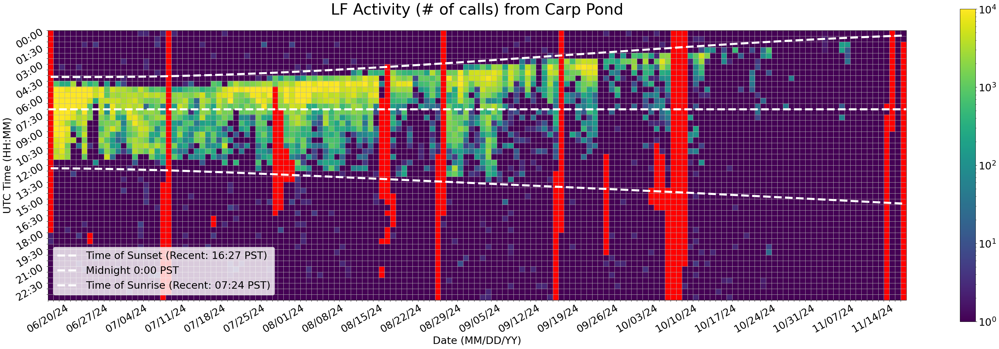

/home/adkris/bat-detector-msds/notebooks/../src/batdt2_pipeline.py:680: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  resampled_df = new_df.resample(data_params["resample_tag"], on="date_and_time_UTC").sum().between_time(cfg['recording_start'], cfg['recording_end'], inclusive='left')


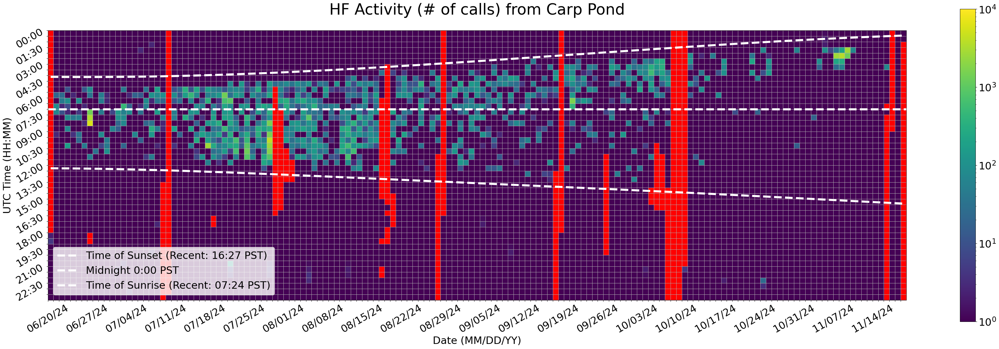

In [9]:
site = "Carp Pond"
cfg = dict()
cfg["site"] = site
cfg["recording_start"] = '00:00'
cfg["recording_end"] = '23:59'
cfg['resample_tag'] = "30T"
cfg['show_PST'] = False
cfg['selection_of_dates'] = 'recover-202[4|5]*'

for group in ['','LF','HF']:
    activity_df = batdetect2_pipeline.construct_cumulative_activity(cfg, cfg, group, save=True)
    batdetect2_pipeline.plot_cumulative_activity(activity_df, cfg, group, save=True)

/home/adkris/bat-detector-msds/notebooks/../src/batdt2_pipeline.py:680: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  resampled_df = new_df.resample(data_params["resample_tag"], on="date_and_time_UTC").sum().between_time(cfg['recording_start'], cfg['recording_end'], inclusive='left')


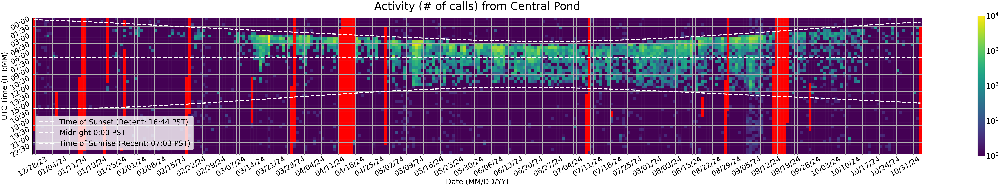

/home/adkris/bat-detector-msds/notebooks/../src/batdt2_pipeline.py:680: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  resampled_df = new_df.resample(data_params["resample_tag"], on="date_and_time_UTC").sum().between_time(cfg['recording_start'], cfg['recording_end'], inclusive='left')


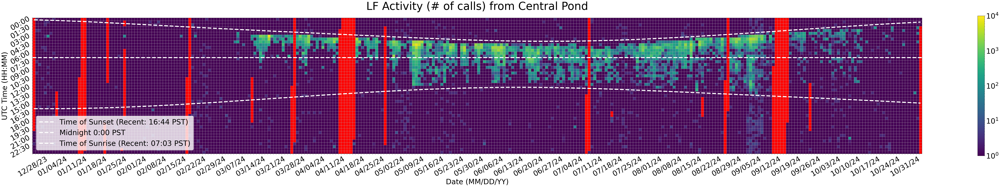

/home/adkris/bat-detector-msds/notebooks/../src/batdt2_pipeline.py:680: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  resampled_df = new_df.resample(data_params["resample_tag"], on="date_and_time_UTC").sum().between_time(cfg['recording_start'], cfg['recording_end'], inclusive='left')


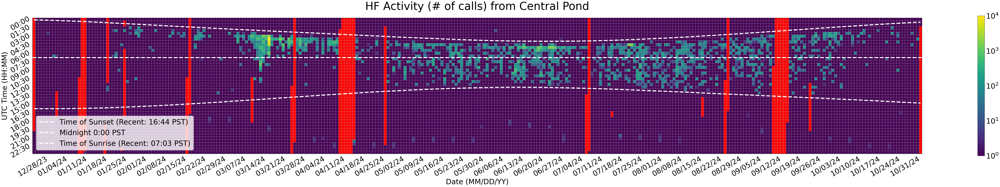

In [11]:
site = "Central Pond"
cfg = dict()
cfg["site"] = site
cfg["recording_start"] = '00:00'
cfg["recording_end"] = '23:59'
cfg['resample_tag'] = "30T"
cfg['show_PST'] = False
cfg['selection_of_dates'] = 'recover-202[4|5]*'

for group in ['','LF','HF']:
    activity_df = batdetect2_pipeline.construct_cumulative_activity(cfg, cfg, group, save=False)
    batdetect2_pipeline.plot_cumulative_activity(activity_df, cfg, group, save=False)

/home/adkris/bat-detector-msds/notebooks/../src/batdt2_pipeline.py:680: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  resampled_df = new_df.resample(data_params["resample_tag"], on="date_and_time_UTC").sum().between_time(cfg['recording_start'], cfg['recording_end'], inclusive='left')


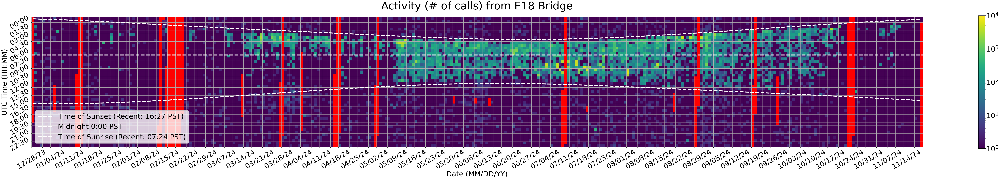

/home/adkris/bat-detector-msds/notebooks/../src/batdt2_pipeline.py:680: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  resampled_df = new_df.resample(data_params["resample_tag"], on="date_and_time_UTC").sum().between_time(cfg['recording_start'], cfg['recording_end'], inclusive='left')


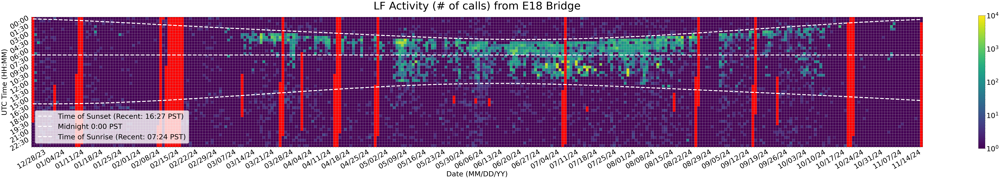

/home/adkris/bat-detector-msds/notebooks/../src/batdt2_pipeline.py:680: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  resampled_df = new_df.resample(data_params["resample_tag"], on="date_and_time_UTC").sum().between_time(cfg['recording_start'], cfg['recording_end'], inclusive='left')


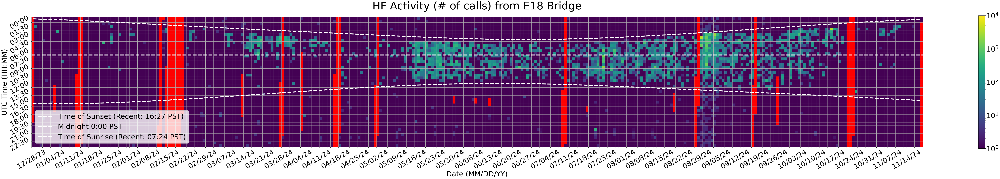

In [12]:
site = "E18 Bridge"
cfg = dict()
cfg["site"] = site
cfg["recording_start"] = '00:00'
cfg["recording_end"] = '23:59'
cfg['resample_tag'] = "30T"
cfg['show_PST'] = False
cfg['selection_of_dates'] = 'recover-202[4|5]*'

for group in ['','LF','HF']:
    activity_df = batdetect2_pipeline.construct_cumulative_activity(cfg, cfg, group, save=False)
    batdetect2_pipeline.plot_cumulative_activity(activity_df, cfg, group, save=False)

### c) The below code generates a plot for a single deployment session given the deployment detection file path

In [22]:
sites = ['E18 Bridge', 'Central Pond', 'Foliage', 'Telephone Field']

cfg = dict()
cfg['recover_folder'] = 'recover-20230927'
cfg['sd_unit'] = '009'
cfg['site'] = 'Central Pond'
cfg['output_dir'] = Path(f"../output_dir/{cfg['recover_folder']}")
cfg['cycle_length'] = 1800
cfg['duration'] = 1800
cfg["recording_start"] = '00:00'
cfg["recording_end"] = '23:59'

data_params = batdetect2_pipeline.get_params_relevant_to_data(cfg)
cfg["csv_filename"] = f"bd2__{data_params['recover_folder']}_{data_params['audiomoth_folder']}"

data_params['resample_in_min'] = 30
data_params['resample_tag'] = f"{data_params['resample_in_min']}T"

batdetect2_pipeline.construct_activity_arr(cfg, data_params)
for group in batdetect2_pipeline.FREQ_GROUPS[cfg['site']].keys():
    activity_df = batdetect2_pipeline.shape_activity_array_into_grid(cfg, data_params, group)
    batdetect2_pipeline.plot_activity_grid(activity_df, data_params, group)

Searching for files from recover-20230927 and UBNA_009


IndexError: index 0 is out of bounds for axis 0 with size 0

### d) The below code was written to loop for all deployment sessions to have a single uniform format between deployment sessions. The `bd2__` detection files remain untouched.

In [ ]:
def get_params_relevant_to_data_ubna_data_03(cfg):
    data_params = dict()
    data_params['recover_folder'] = cfg['recover_folder']
    data_params["audiomoth_folder"] = f"UBNA_{cfg['sd_unit']}"
    print(f"Searching for files from {cfg['recover_folder']} and {data_params['audiomoth_folder']}")

    cur_data_records = dd.read_csv(f'../output_dir/ubna_data_03_collected_audio_records.csv', dtype=str).compute()
    if 'Unnamed: 0' in cur_data_records.columns:
        cur_data_records.drop(columns='Unnamed: 0', inplace=True)
    print(cur_data_records.columns)
    cur_data_records["datetime_UTC"] = pd.DatetimeIndex(cur_data_records["datetime_UTC"])
    cur_data_records.set_index("datetime_UTC", inplace=True) 
    
    files_from_deployment_session = filter_df_with_deployment_session_ubna_data_03(cur_data_records, data_params['recover_folder'], cfg)
    site_name = files_from_deployment_session["site_name"].values[0]
    data_params["site"] = site_name
    if data_params["site"] != "(Site not found in Field Records)":
        data_params['output_dir'] = cfg["output_dir"] / data_params["site"]
    elif cfg['site']!='none':
        data_params['output_dir'] = cfg["output_dir"] / cfg['site']
        data_params['site'] = cfg['site']
    else:
        data_params['output_dir'] = cfg["output_dir"] / f"UBNA_{cfg['sd_unit']}"
    print(f"Will save csv file to {data_params['output_dir']}")

    data_params['ref_audio_files'] = sorted(list(files_from_deployment_session["file_path"].apply(lambda x : Path(x)).values))
    file_status_cond = files_from_deployment_session["file_status"] == "Usable for detection"
    file_duration_cond = files_from_deployment_session["file_duration"].astype('float') >= (cfg['cycle_length'])/2
    good_deploy_session_df = files_from_deployment_session.loc[file_status_cond & file_duration_cond]
    data_params['good_audio_files'] = sorted(list(good_deploy_session_df["file_path"].apply(lambda x : Path(x)).values))

    if data_params['good_audio_files'] == data_params['ref_audio_files']:
        print("All files from deployment session good!")
    else:
        print("Error files exist!")

    return data_params

def filter_df_with_deployment_session_ubna_data_03(ubna_data_df, recover_folder, cfg):
    recover_folder_cond = ubna_data_df["recover_folder"] == recover_folder
    sd_unit_cond = ubna_data_df["sd_card_num"] == cfg["sd_unit"]
    filtered_location_df = ubna_data_df.loc[recover_folder_cond&sd_unit_cond].sort_index()

    start_time, end_time = batdetect2_pipeline.get_recording_period(Path(filtered_location_df['file_path'].values[0]).parent)
    file_minutes = pd.to_datetime(filtered_location_df.index.minute, format="%M")
    offset_from_config = dt.timedelta(minutes=dt.datetime.strptime(start_time, "%H:%M").minute)
    corrected_minutes = (file_minutes - offset_from_config).minute
    # datetime_cond = np.logical_and(np.mod(corrected_minutes, (cfg['cycle_length']/60)) == 0, filtered_location_df.index.second == 0)
    datetime_cond = filtered_location_df.index.second == 0
    file_error_cond = np.logical_and((filtered_location_df["file_duration"]!='File has no comment due to error!'), (filtered_location_df["file_duration"]!='File has no Audiomoth-related comment'))
    all_errors_cond = np.logical_and((filtered_location_df["file_duration"]!='Is empty!'), file_error_cond)
    filtered_location_df = filtered_location_df.loc[datetime_cond&all_errors_cond].sort_index()
    filtered_location_nightly_df = filtered_location_df.between_time(cfg['recording_start'], cfg['recording_end'], inclusive="left")

    return filtered_location_nightly_df

In [ ]:
def get_params_relevant_to_data_ubna_data_02(cfg):
    data_params = dict()
    data_params['recover_folder'] = cfg['recover_folder']
    data_params["audiomoth_folder"] = f"UBNA_{cfg['sd_unit']}"
    print(f"Searching for files from {cfg['recover_folder']} and {data_params['audiomoth_folder']}")

    cur_data_records = dd.read_csv(f'../output_dir/ubna_data_02_collected_audio_records.csv', dtype=str).compute()
    if 'Unnamed: 0' in cur_data_records.columns:
        cur_data_records.drop(columns='Unnamed: 0', inplace=True)
    print(cur_data_records.columns)
    cur_data_records["datetime_UTC"] = pd.DatetimeIndex(cur_data_records["Datetime UTC"])
    cur_data_records.set_index("datetime_UTC", inplace=True) 
    
    files_from_deployment_session = filter_df_with_deployment_session_ubna_data_02(cur_data_records, data_params['recover_folder'], cfg)
    site_name = files_from_deployment_session["Site name"].values[0]
    data_params["site"] = site_name
    if data_params["site"] != "(Site not found in Field Records)":
        data_params['output_dir'] = cfg["output_dir"] / data_params["site"]
    elif cfg['site']!='none':
        data_params['output_dir'] = cfg["output_dir"] / cfg['site']
        data_params['site'] = cfg['site']
    else:
        data_params['output_dir'] = cfg["output_dir"] / f"UBNA_{cfg['sd_unit']}"
    print(f"Will save csv file to {data_params['output_dir']}")

    data_params['ref_audio_files'] = sorted(list(files_from_deployment_session["File path"].apply(lambda x : Path(x)).values))
    file_status_cond = files_from_deployment_session["File status"] == "Usable for detection"
    file_duration_cond = files_from_deployment_session["File duration"].astype('float') >= (cfg['cycle_length'])/2
    good_deploy_session_df = files_from_deployment_session.loc[file_status_cond & file_duration_cond]
    data_params['good_audio_files'] = sorted(list(good_deploy_session_df["File path"].apply(lambda x : Path(x)).values))

    if data_params['good_audio_files'] == data_params['ref_audio_files']:
        print("All files from deployment session good!")
    else:
        print("Error files exist!")

    return data_params

def filter_df_with_deployment_session_ubna_data_02(ubna_data_df, recover_folder, cfg):
    recover_folder_cond = ubna_data_df["Recover folder"] == recover_folder
    sd_unit_cond = ubna_data_df["SD card #"] == cfg["sd_unit"]
    filtered_location_df = ubna_data_df.loc[recover_folder_cond&sd_unit_cond].sort_index()

    start_time, end_time = batdetect2_pipeline.get_recording_period(Path(filtered_location_df['File path'].values[0]).parent)
    file_minutes = pd.to_datetime(filtered_location_df.index.minute, format="%M")
    offset_from_config = dt.timedelta(minutes=dt.datetime.strptime(start_time, "%H:%M").minute)
    corrected_minutes = (file_minutes - offset_from_config).minute
    datetime_cond = np.logical_and(np.mod(corrected_minutes, (cfg['cycle_length']/60)) == 0, filtered_location_df.index.second == 0)
    # datetime_cond = filtered_location_df.index.second == 0
    file_error_cond = np.logical_and((filtered_location_df["File duration"]!='File has no comment due to error!'), (filtered_location_df["File duration"]!='File has no Audiomoth-related comment'))
    all_errors_cond = np.logical_and((filtered_location_df["File duration"]!='Is empty!'), file_error_cond)
    filtered_location_df = filtered_location_df.loc[datetime_cond&all_errors_cond].sort_index()
    filtered_location_nightly_df = filtered_location_df.between_time(cfg['recording_start'], cfg['recording_end'], inclusive="left")

    return filtered_location_nightly_df

In [ ]:
recover_dates = sorted(list(Path('../output_dir').glob(pattern='recover-202[3|4]0115*')))
sites = ['E18 Bridge', 'Central Pond', 'Foliage', 'Telephone Field']
sd_card_pattern = re.compile(r'UBNA_0[0-9][0-9]')

for dir in recover_dates:

    cfg = dict()
    cfg['recover_folder'] = dir.name
    cfg['output_dir'] = Path(f"../output_dir/{cfg['recover_folder']}")
    cfg['cycle_length'] = 600
    cfg['duration'] = 300
    cfg["recording_start"] = '00:00'
    cfg["recording_end"] = '23:59'

    for site in sites:
        cfg['site'] = site
        print(Path(cfg['output_dir'] / site))
        print(Path(cfg['output_dir'] / site).is_dir())
        if Path(cfg['output_dir'] / site).is_dir():
            cfg['sd_unit'] = sd_card_pattern.search(list((Path(cfg['output_dir'] / site)).glob(pattern='*'))[0].name).group().split('_')[1]
            cfg["csv_filename"] = f"bd2__{cfg['recover_folder']}_UBNA_{cfg['sd_unit']}"
            print(cfg)

            data_params = get_params_relevant_to_data_ubna_data_03(cfg)
            data_params['resample_in_min'] = 30
            data_params['resample_tag'] = f"{data_params['resample_in_min']}T"
            print(data_params)

            batdetect2_pipeline.construct_activity_arr(cfg, data_params)